# Annotation

(cellular-structure-annotation-key-takeaway-1)=
## Motivation

To understand your data better and make use of existing knowledge, it is important to figure out the "cellular identity" of each of the cells in your data.
The process of labeling groups of cells in your data based on known (or sometimes unknown) cellular phenotypes is called "cell annotation".
Whereas there are many ways to annotate your cells (e.g. based on batch, disease, sex and more), in this notebook we will focus on the annotation of "cell types".

So what is a cell type?
Biologists use the term cell type to denote a cellular phenotype that is robust across datasets, identifiable based on expression of specific markers (i.e. proteins or gene transcripts), and often linked to specific functions.
For example, a plasma B cell is a type of white blood cell that secretes antibodies used to fight pathogens and it can be identified using specific markers.
Knowing which cell types are in your sample is essential in understanding your data.
For example, knowing that there are specific immune cell types in a tumor or unusual hematopoietic stem cells in your bone marrow sample can be a valuable insight into the disease you might be studying.

However, like with any categorization the size of categories and the borders drawn between them are partly subjective and can change over time, e.g. because new technologies allow for a higher resolution view of cells, or because specific "sub-phenotypes" that were not considered biologically meaningful are found to have important biological implications (see e.g. {cite}`anno:KadurLakshminarasimhaMurthy2022`).
Cell types are therefore often further classified into "subtypes" or "cell states" (e.g. activated versus resting) and some researchers use the term "cell identity" to avoid this sometimes arbitrary distinction of cell types, cell subtypes and cell states.
For a more detailed discussion of this topic, we recommend the review by Wagner et al. {cite}`anno:Wagner2016` and the recently published review by Zeng {cite}`anno:ZENG20222739`.

Similarly, multiple cell types can be part of a single continuum, where one cell type might transition or differentiate into another.
For example, in hematopoiesis cells differentiate from a stem cell into a specific immune cell type.
Although hard borders between early and late stages of this differentiation are often drawn, the state of these cells can more accurately be described by the differentiation coordinate between the less and more differentiated cellular phenotypes.
We will discuss differentiation and cellular trajectories in subsequent chapters.

So how do we go about annotating cells in single-cell data?
There are multiple ways to do it and we will give an overview of different approaches below.
As we are working with transcriptomic data, each of these methods is ultimately based on the expression of specific genes or gene sets, or general transcriptomic similarity between cells. 

## Environment setup

We'll filter out some deprecation and performance warnings that do not affect our code:

In [6]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

from numba.core.errors import NumbaDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

Load the needed modules:

In [7]:
from pathlib import Path

import celltypist
import lamindb as ln
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scarches as sca
import seaborn as sns
from celltypist import models
from scipy.sparse import csr_matrix

assert ln.setup.settings.instance.slug == "theislab/sc-best-practices"

ln.track("BnpvfJLWjHuE")

→ loaded Transform('BnpvfJLWjHuE0000', key='annotation.ipynb'), re-started Run('93AaIjvLkC7oqvcUhr04') at 2026-02-16 13:50:13 UTC
→ notebook imports: celltypist==1.6.3 lamindb==2.0.1 matplotlib==3.10.8 numba==0.63.1 numpy==2.3.5 pandas==2.2.3 scArches==0.6.1 scanpy==1.11.1 scipy==1.16.3 seaborn==0.13.2


One more pandas warning to filter:

In [8]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

We will continue working with the scRNA-seq dataset that we earlier preprocessed and will now annotate it.

Set figure parameters:

In [9]:
sc.set_figure_params(figsize=(5, 5))

## Load data

Let's read in the toy dataset we will use for this tutorial. It includes a single sample ("site4-donor8") of the data also used in other parts of the book. Moreover, cells that didn't pass QC have already been removed.

In [10]:
af = ln.Artifact.get(key="cellular_structure/s4d8_clustered.h5ad", is_latest=True)
adata = af.load(is_run_input=False)

(cellular-structure-annotation-key-takeaway-2)=
## Manual annotation

The classical or oldest way to perform cell type annotation is based on a single or small set of {term}`marker genes <marker gene>` known to be associated with a particular cell type.
This approach dates back to "pre-scRNA-seq times", when single-cell data was low-dimensional (e.g., FACS data with gene panels consisting of no more than 30-40 genes).
It is a fast and transparent way to annotate your data.
However, when no unique markers exist for a specific cell type (which is often the case), this approach can get more complicated and even less objective, with combinations of markers or expression thresholds necessary for proper annotation.
A robust set of marker genes and prior knowledge or annotation experience can help here, but the approach comes with the risk of unclear and subjective decision-making. 


In this setting, the data is often clustered before annotation, so that we can annotate groups of cells instead of making a per-cell call.
This is not only less laborious but also more robust to noise: a single cell might not have a count for a specific marker even if it was expressed in that cell, simply due to the inherent sparsity of single-cell data.
Clustering enables the detection of cells highly similar in overall gene expression and can therefore account for drop-outs at the single-cell level. 


Finally, there are two angles from which to approach the marker-gene-based annotation.
One option is to work from a table of marker genes for all the cell types you expect in your data and check in which clusters those genes are expressed.
The other option is to check which genes are highly expressed in the clusters you defined and then check if they are associated with known cell types or states.
If necessary, one can move back and forth between those approaches.
We will show examples of both below.


### From markers to cluster annotation

Let's get started with the known-marker-based approach.
We will first list a set of markers for cell types in the bone marrow here that is based on literature: previous papers that study specific cell types and subtypes and report marker genes for those cell types.
Note that markers at the protein level (e.g., used for FACS) sometimes do not work as well in transcriptomic data; hence, using markers from RNA-based papers is often more likely to work.
Moreover, sometimes markers in one dataset do not turn out to work as well in other datasets.
Ideally, a marker set is therefore validated across multiple datasets.
Finally, it is often useful to work together with experts: as a bioinformatician, try to team up with a biologist who has more extensive knowledge of the tissue, the biology, the expected cell types and markers, etc.


In [11]:
# keys: cell types or populations, values: lists of marker genes
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

```{adnomition} Negative markers
:class: dropdown
A negative marker is a gene that is not expressed in a specific cell type or condition, and is used to exclude or distinguish that group from others.
While positive markers are genes actively expressed to identify a cell type (e.g., CD4 for helper T cells),
Negative markers are genes that a cell type should not express—their absence helps confirm identity.
```

Subset to only the markers that were detected in our data.
We will loop through all cell types and keep only the genes that we find in our adata object as markers for that cell type.
This will prevent errors once we start plotting.

In [12]:
marker_genes_in_data = {}
for ct, markers in marker_genes.items():
    markers_found = []
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

To see where these markers are expressed, we can work with a 2-dimensional visualization of the data, such as a UMAP.
We'll construct that UMAP here based on the scran-normalized count data, using only the highly deviant genes.
Note that we first perform a PCA on the normalized counts to reduce the dimensionality of the data before we generate the UMAP.


To start we store our raw counts in `.layers['counts']`, so that we will still have access to them later if needed.
We then set our `adata.X` to the scran-normalized, log-transformed counts.

In [13]:
adata.layers["counts"] = adata.X
adata.X = adata.layers["scran_normalization"]

We furthermore set our `adata.var.highly_variable` to the highly deviant genes.
Scanpy uses this var column in downstream calculations, such as the PCA below.

In [14]:
adata.var["highly_variable"] = adata.var["highly_deviant"]

Now perform PCA.
We use the highly deviant genes (set as "highly variable" above) to reduce noise and strengthen signal in our data and set number of components to the default n=50.
50 is on the high side for data of a single sample, but it will ensure that we don't ignore important variation in our data.

In [15]:
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)

Calculate the neighbor graph based on the PCs:

In [16]:
sc.pp.neighbors(adata)

And use that neighbor graph to calculate a 2-dimensional UMAP embedding of the data:

In [17]:
sc.tl.umap(adata)

Now show expression of the markers using the calculated UMAP.
We'll limit ourselves to B/plasma cell subtypes for this example.
Note from the marker dictionary above that there are three negative markers in our list: IGHD and IGHM for B1 B, and PAX5 for plasmablasts, meaning that this cell type is expected not to or to lowly express those markers.

Let's list the B cell subtypes we want to show the markers for:

In [18]:
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

And now plot one UMAP per marker for each of the B cell subtypes. Note that we can only plot the markers that are present in our data.

NAIVE CD20+ B:


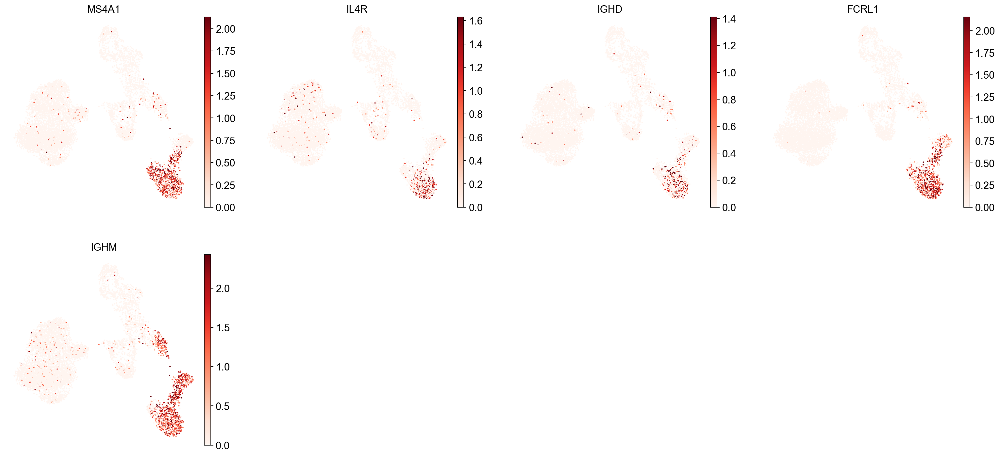





B1 B:


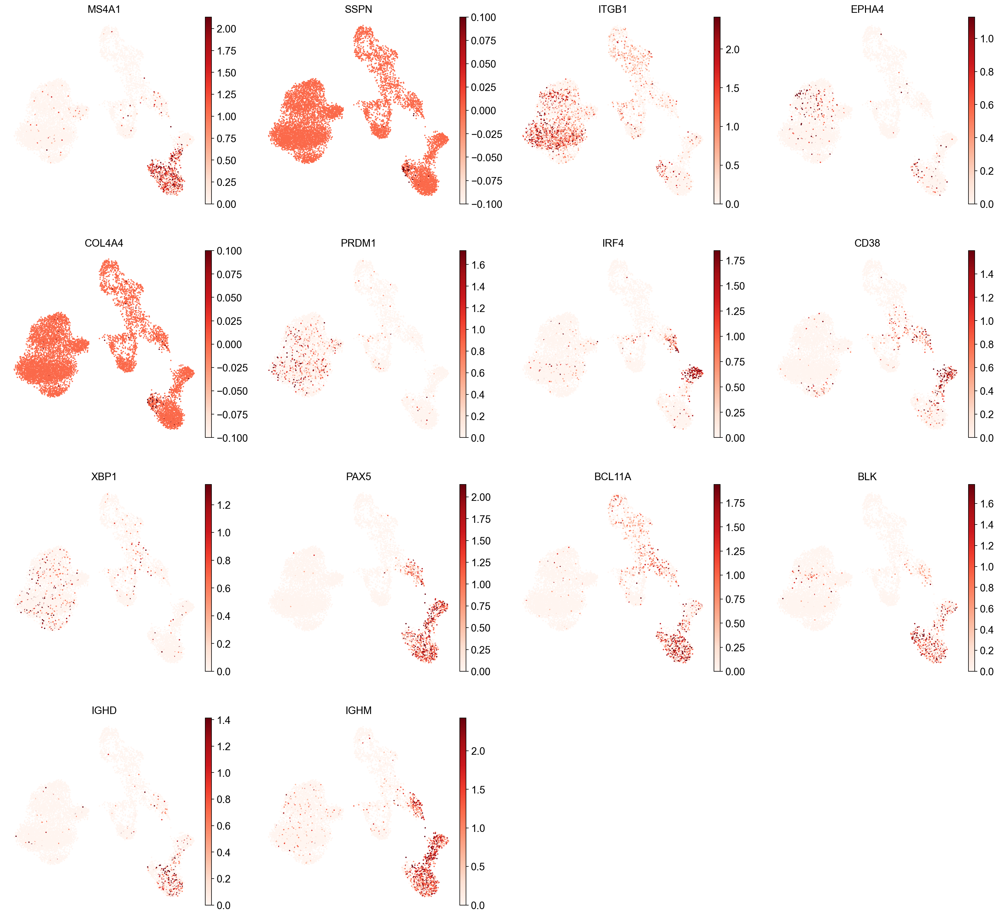





TRANSITIONAL B:


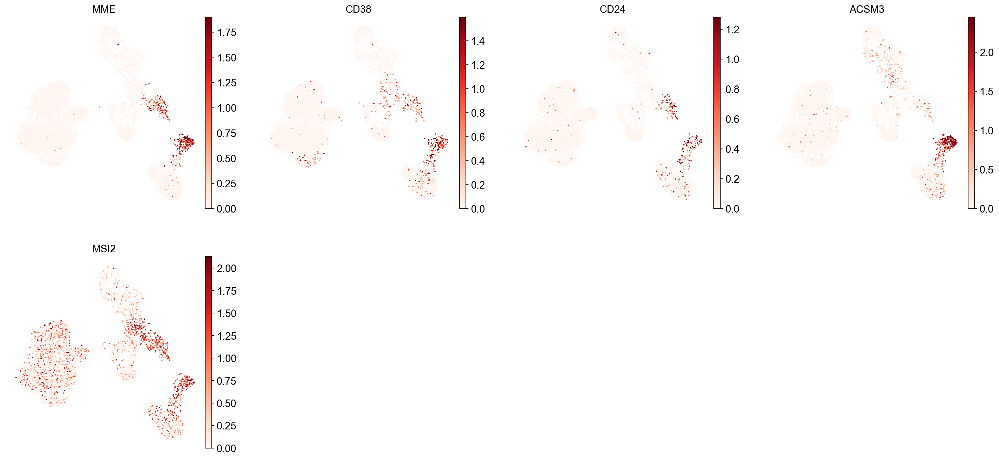





PLASMA CELLS:


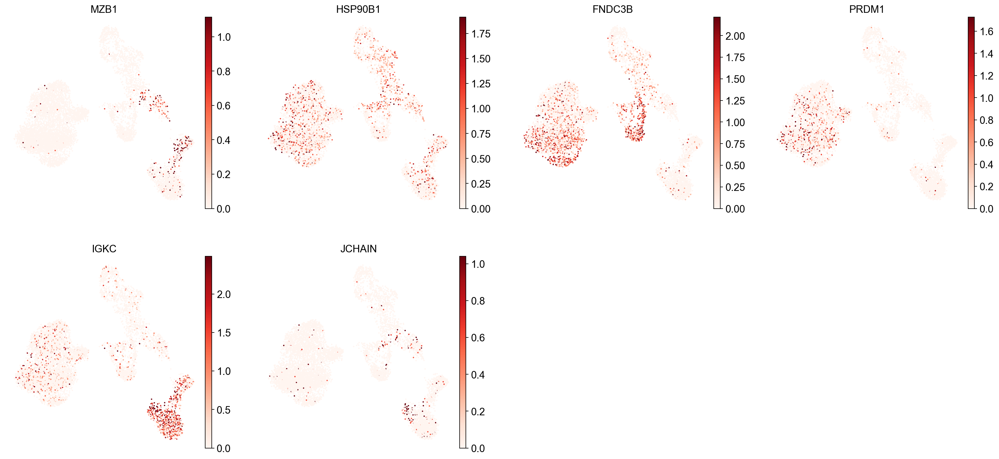





PLASMABLAST:


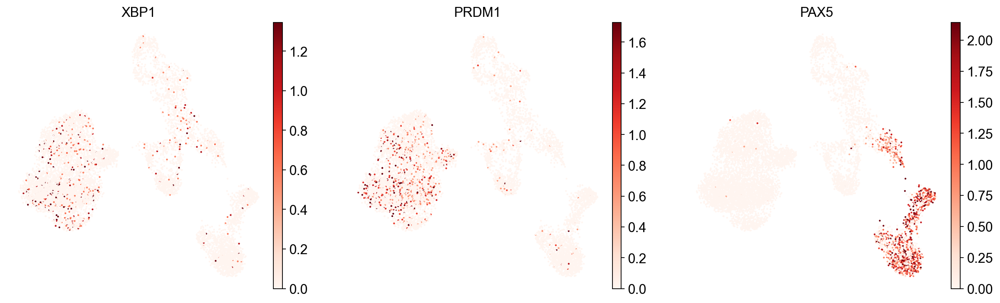

In [19]:
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

As you can see, even markers for a single cell type are often expressed in different subsets of the data, i.e. individual markers are often not uniquely expressed in a single cell type.
Rather, it is the intersection of those subsets that will tell you where your cell type of interest is. 

Another thing you might notice is that markers are often sparsely expressed, i.e., it is often only a subset of cells of a cell type in which a marker was detected.
This is due to the nature of scRNA-seq data: we only sequence a small subset of the total amount of RNA molecules in the cell, and due to this subsampling, we will sometimes not sample transcripts from specific genes in a cell even if they were expressed in that cell.
Therefore, we do not annotate single cells based on a minimum expression threshold of, e.g., a set of markers.
Instead, we first subdivide the data into groups of similar cells (i.e., "partition" the data) by clustering, thereby accounting for "missing transcripts" of single genes and rather grouping based on overall transcriptomic similarity.
We can then annotate those clusters based on their overall marker expression patterns.

Let us cluster our data now.
We will use the Leiden algorithm {cite}`anno:Traag2019` as discussed in the Clustering chapter to define a grouping of our data into similar subsets of cells:

In [20]:
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")

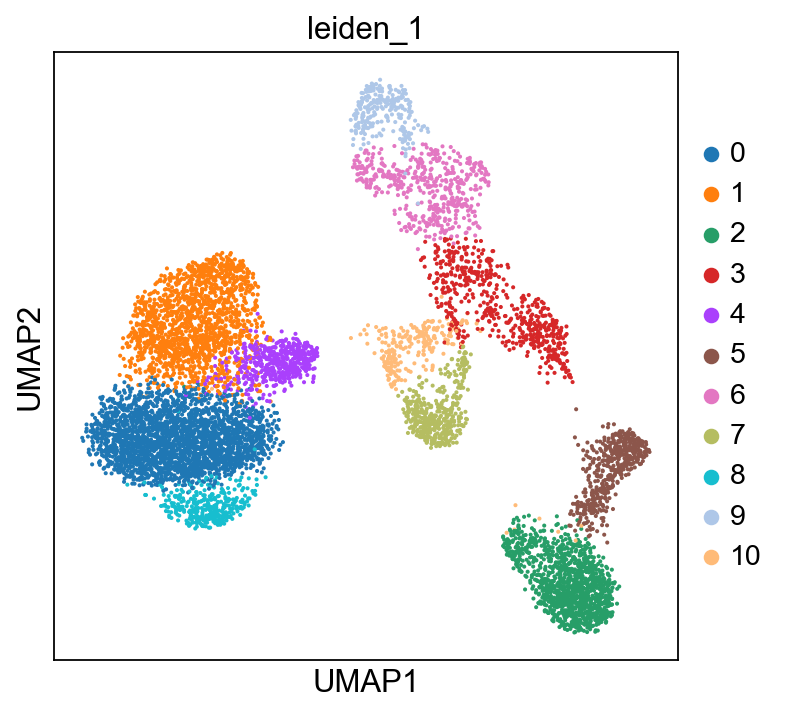

In [21]:
sc.pl.umap(adata, color="leiden_1")

In case you want the partitioning to be finer, you can change the resolution to a higher level by changing the resolution parameter of the clustering:

In [22]:
sc.tl.leiden(adata, resolution=2, key_added="leiden_2")

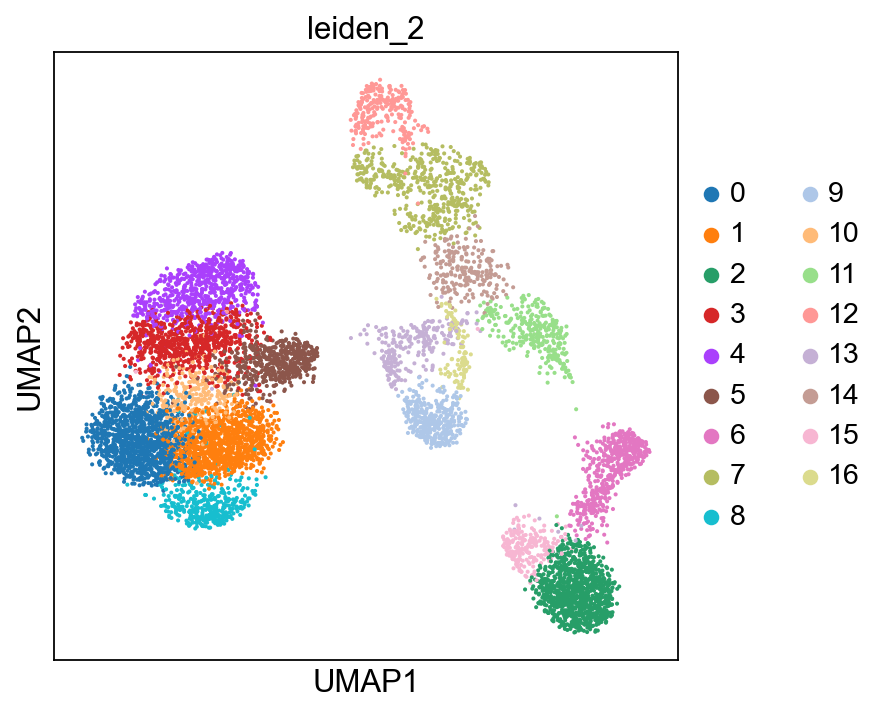

In [23]:
sc.pl.umap(adata, color="leiden_2")

Or with cluster numbers in the UMAP:

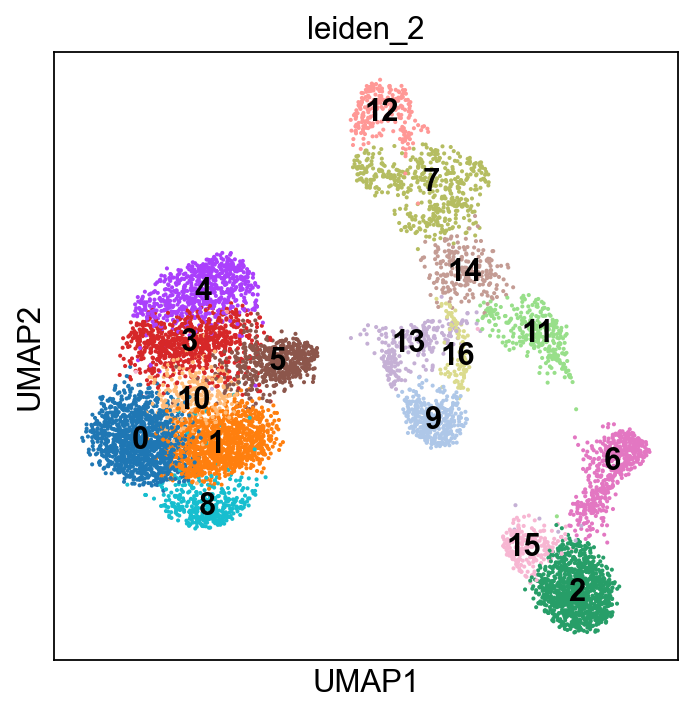

In [24]:
sc.pl.umap(adata, color="leiden_2", legend_loc="on data")

This clustering is much finer and, in some cases, will help you annotate the data with more detail.
You can play around with the resolution parameter to find the setting that best captures the marker expression patterns you observe.
In our case, we will stick to the original resolution:

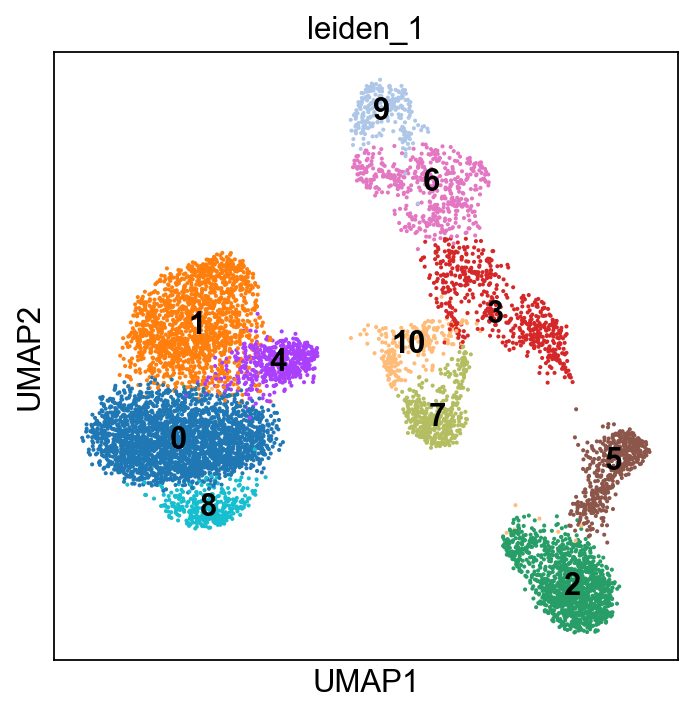

In [25]:
sc.pl.umap(adata, color="leiden_1", legend_loc="on data")

Scrolling back up, you will see that cluster 2 consistently expresses Naive CD20+ B cell markers.
We can also visualize this using a dotplot:

In [26]:
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}

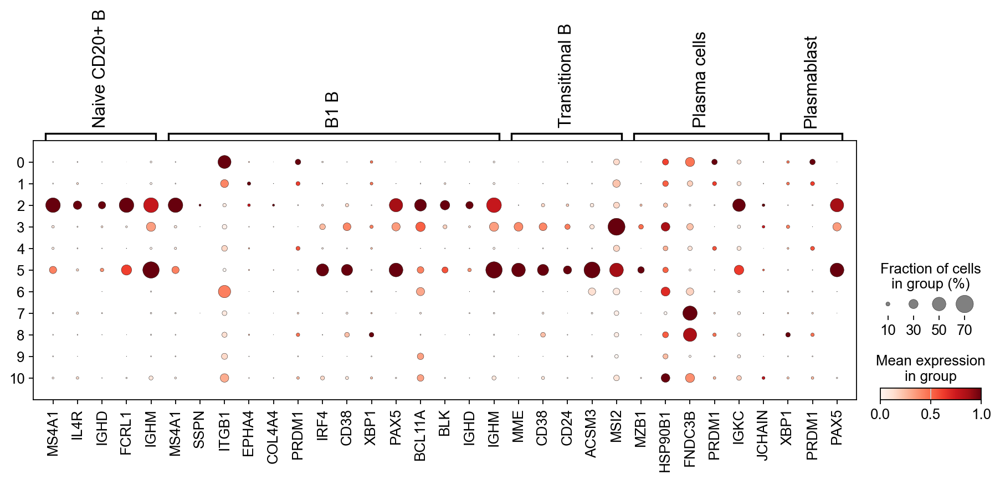

In [27]:
sc.pl.dotplot(
    adata,
    groupby="leiden_1",
    var_names=B_plasma_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

Using a combination of visual inspection of the UMAPs and the dotplot above we can now start annotating the clusters:

In [28]:
cl_annotation = {
    "2": "Naive CD20+ B",
    "5": "Transitional B",
}

You might notice that the annotation of B1 B cells is difficult, with none of the clusters expressing all the B1 B markers and several clusters expressing some of the markers.
We often see that markers that work for one dataset do not work as well for others.
This can be due to differences in sequencing depth, but also due to other sources of variation between datasets or samples. 

Let's visualize our annotations so far:

In [29]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_1.map(cl_annotation)

... storing 'manual_celltype_annotation' as categorical


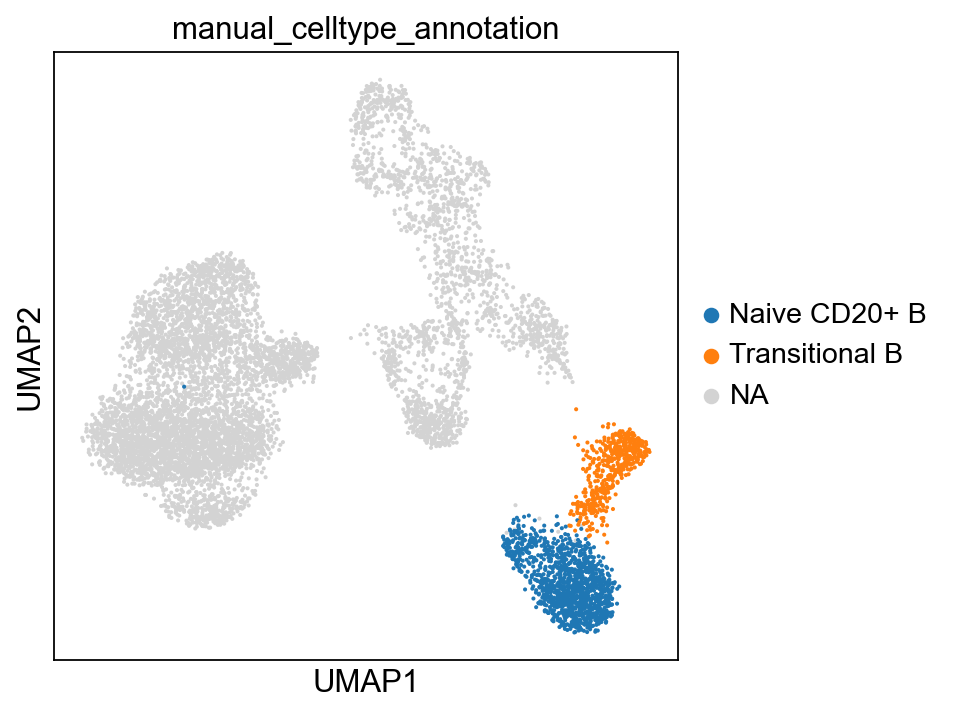

In [30]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

### From cluster differentially expressed genes to cluster annotation

Conversely, we can calculate marker genes per cluster and then look up whether we can link those marker genes to any known biology, such as cell types and/or states.
For marker gene calculation of clusters, simple methods such as the Wilcoxon rank-sum test are thought to perform best {cite}`anno:Pullin2022.05.09.490241`.
Importantly, as the definition of the clusters is based on the same data as used for these statistical tests, the p-values of these tests will be inflated as also described here {cite}`anno:ZHANG2019383`.

Let's calculate the differentially expressed genes for every cluster, compared to the rest of the cells in our adata:

In [31]:
sc.tl.rank_genes_groups(
    adata, groupby="leiden_1", method="wilcoxon", key_added="dea_leiden_1"
)

We can visualize expression of the top differentially expressed genes per cluster with a standard scanpy dotplot:

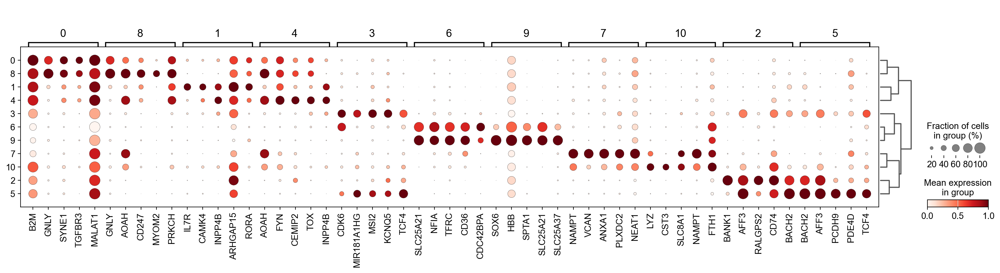

In [32]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_1", standard_scale="var", n_genes=5, key="dea_leiden_1"
)

As you can see above, a lot of the differentially expressed genes are highly expressed in multiple clusters.
We can filter the differentially expressed genes to select for more cluster-specific differentially expressed genes:

In [33]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_1",
    key_added="dea_leiden_1_filtered",
)

Visualize the filtered genes :

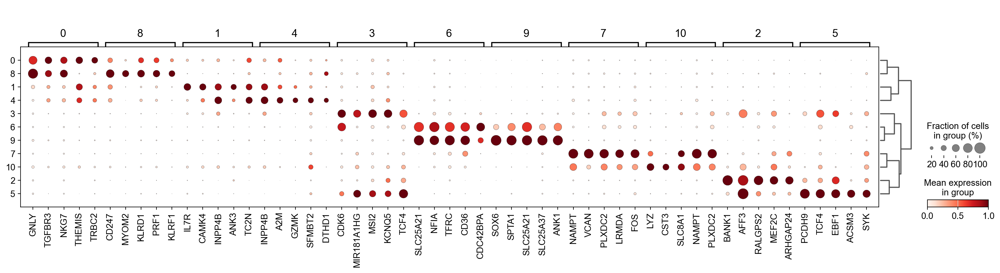

In [34]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_1",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_1_filtered",
)

Let's take a look at cluster 15, which seems to have a set of relatively unique markers including TFRC, SPTA1, ANK1, SLC25A37, and SLC25A21.
Some googling tells us that e.g. TFRC is a marker for erythroid {cite}`anno:keelEvidenceThatExpression2015`.
In the UMAP we can see that these genes are expressed throughout cluster 15: 


cluster 5 - PCDH9, TCF4, EBF1, ACSM3, SYK


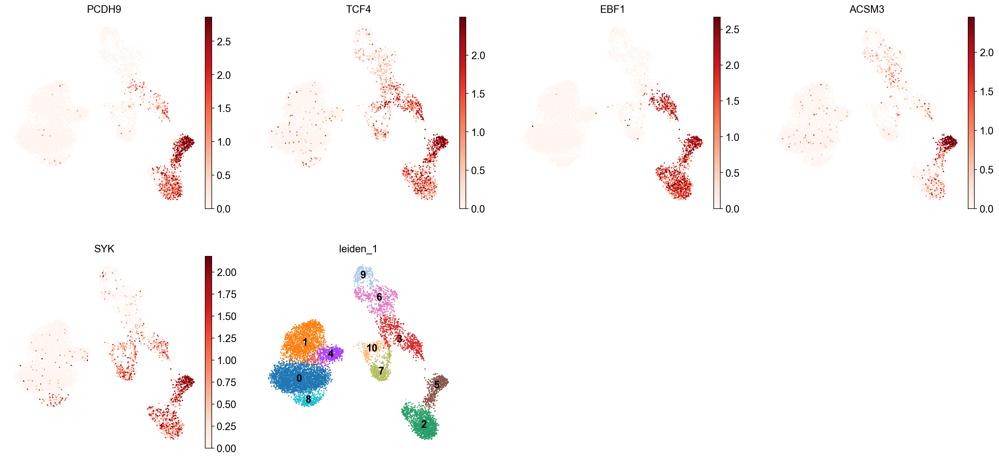

In [35]:
# sc.pl.umap(
#     adata,
#     color=["TFRC", "SPTA1", "ANK1", "SLC25A37", "SLC25A21", "leiden_1"],
#     vmax="p99",
#     legend_loc="on data",
#     frameon=False,
#     cmap="Reds",
# )

sc.pl.umap(
    adata,
    color=["PCDH9", "TCF4", "EBF1", "ACSM3", "SYK", "leiden_1"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

However, marker-based annotation can be sensitive to the cluster resolution you choose, the robustness and uniqueness of the marker sets you have, and your knowledge of the cell types to be expected in your data.
Therefore, cluster annotations are not guaranteed to be definitive and should be interpreted with caution.

For this reason, the field is partly trying to move away from manual cluster annotation and rather moving towards automated annotation algorithms instead.
The rest of this tutorial will focus on those options.

Before we move on, store the final bit of annotation information in our adata:

In [ ]:
cl_annotation["5"] = "Erythyroid cells"

In [36]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_1.map(cl_annotation)

(cellular-structure-annotation-key-takeaway-3)=
## Automated annotation

### General remarks

The remainder of the discussed methods will be methods for automated, rather than manual annotation of your data.
Unlike the method showcased above, each of these methods enables you to annotate your data in an automated way.
They are based on different principles, sometimes requiring pre-defined sets of markers, other times trained on pre-existing full scRNA-seq datasets.
As discussed below, the resulting annotations can be of varying quality.
It is therefore important to regard these methods as a starting point rather than an end-point of the annotation process.
See also several reviews {cite}`anno:PASQUINI2021961`, {cite}`anno:Abdelaal2019` for a more elaborate discussion of automated annotation methods.

As said, the quality of automatically generated annotations can vary.
More specifically, the quality of the annotations depends on:
1) The type of classifier chosen: Previous benchmark studies have shown that different types of classifiers often perform comparably, with neural network-based methods generally not outperforming general-purpose models such as support vector machines or linear regression models{cite}`anno:Abdelaal2019`, {cite}`anno:PASQUINI2021961`, {cite}`anno:Huang2021`.<br>
2) The quality of the data that the classifier was trained on.
If the training data was not well annotated or annotated at low resolution, the classifier will do the same.
Similarly, if the training data and/or its annotation was noisy, the classifier might not perform well.<br>
3) The similarity of your own data to the data that the classifier was trained on.
For example, if the classifier was trained on a drop-seq single cell dataset and your data is 10X single nucleus rather than single cell drop-seq, this might worsen the quality of the annotation.
Classifiers trained on cross-dataset atlases including a diversity of datasets might give more robust and better quality annotations than classifiers trained on a single dataset.
An example is the CellTypist (an automated annotation method that will be discussed more extensively below) classifier trained on the Human Lung Cell Atlas {cite}`anno:Sikkema2023` which includes 14 different lung datasets.
This model is likely to perform better on new lung data than a model that was trained on a single lung dataset.  

The aforementioned points highlight possible disadvantages of using classifiers, depending on the training data and model type.
Nonetheless, there are several important advantages of using pre-trained classifiers to annotate your data.
First, it is a fast and easy way to annotate your data.
The annotation does not require the downloading nor preprocessing of the training data and sometimes merely involves the upload of your data to an online webpage.
Second, these methods don't rely on a partitioning of your data into clusters, as the manual annotation does.
Third, pre-trained classifiers enable you to directly leverage the knowledge and information from previous studies, such as a high quality annotation.
And finally, using such classifiers can help with harmonizing cell-type definitions across a field, thereby clearing the path towards a field-wide consensus on these definitions. 

Finally, as these classifiers are often less transparent than e.g. manual marker-based annotation, a good uncertainty measure quantifying annotation uncertainty will improve the quality and usability of the method.
We will discuss this more extensively further down.

### Marker gene-based classifiers

One class of automated cell type annotation methods relies on a predefined set of marker genes.
Cells are classified into cell types based on their expression levels of these marker genes.
Examples of such methods are Garnett {cite}`anno:Pliner2019` and CellAssign {cite}`anno:Zhang2019`.
The more robust and generalizable the set of marker genes these models are based on, the better the model will perform.
However, like with other models they are likely to be affected by batch effect-related differences between the data the model was trained on and the data that needs to be labeled.
One of the advantages of these methods compared to models based on larger gene sets (see below) is that they are more transparent: we know on the basis of which genes the classification is done.<br>
We will not show an example of marker-based classifiers in this notebook, but encourage you to explore these yourself if you are interested.

### Classifiers based on a wider set of genes

It is worth noting that the methods discussed so far use only a small subset of the genes detected in the data: often a set of only 1 to ~10 marker genes per cell type is used.
An alternative approach is to use a classifier that takes as input a larger set of genes (several thousands or more), thereby making more use of the breadth of scRNA-seq data.
Such classifiers are trained on previously annotated datasets or atlases.
Examples of these are CellTypist {cite}`anno:Conde2022` (see also https://www.celltypist.org, where data can be uploaded to a portal to get automated cell annotations) and Clustifyr {cite}`anno:Fu2020`. 

Let's try out CellTypist on our data.
Based on the CellTypist tutorial (https://www.celltypist.org/tutorials) we know we need to prepare our data so that counts are normalized to 10,000 counts per cell, then log1p-transformed:

In [37]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_total(
    adata_celltypist, target_sum=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

We'll now download the celltypist models for immune cells:

In [38]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 60
📂 Storing models in /Users/seohyon/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


Let's try out both the `Immune_All_Low` and `Immune_All_High` models (these annotate immune cell types finer annotation level (low) and coarser (high)):

In [39]:
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

For each of these, we can see which cell types it includes to see if bone marrow cell types are included:

In [40]:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [41]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

Looks like the models include many different immune cell type progenitors!

Now let's run the models. First the coarse one:

In [42]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

🔬 Input data has 14814 cells and 20223 genes
🔗 Matching reference genes in the model
🧬 5311 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


Transform the predictions to adata to get the full output...

In [43]:
predictions_high_adata = predictions_high.to_adata()

...and copy the results to our original AnnData object:

In [44]:
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

Now the same for the finer annotations:

In [45]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 14814 cells and 20223 genes
🔗 Matching reference genes in the model
🧬 5311 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [46]:
predictions_low_adata = predictions_low.to_adata()

In [47]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

Now plot:

... storing 'manual_celltype_annotation' as categorical


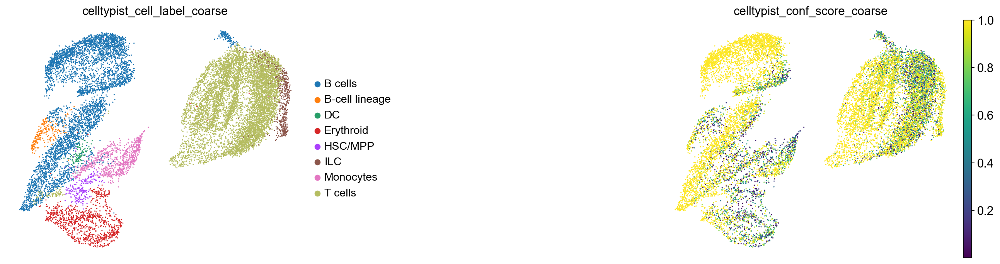

In [48]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

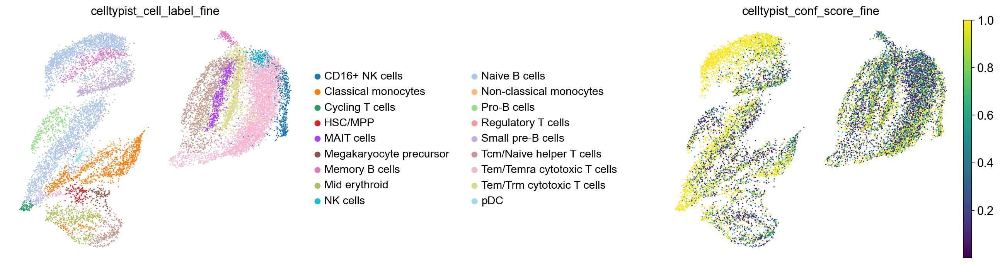

In [49]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

One way of getting a feeling for the quality of these annotations is by looking if the observed cell type similarities correspond to our expectations:

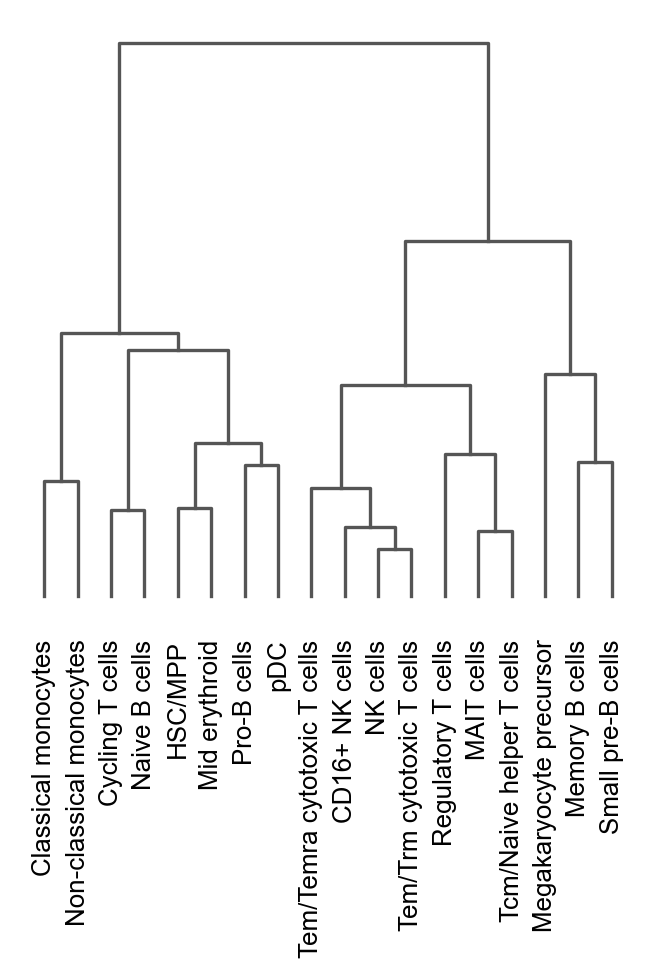

<Axes: >

In [50]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

This dendrogram partly reflects prior knowledge on cell type relations (e.g. B cells largely clustering together), but we also observe some unexpected patterns: Naive B cells cluster with pDC rather than with the other B cells.
This is a red flag!
Possibly, the naive B cell annotations are wrong.

Now let's take a look at our earlier manual annotations:

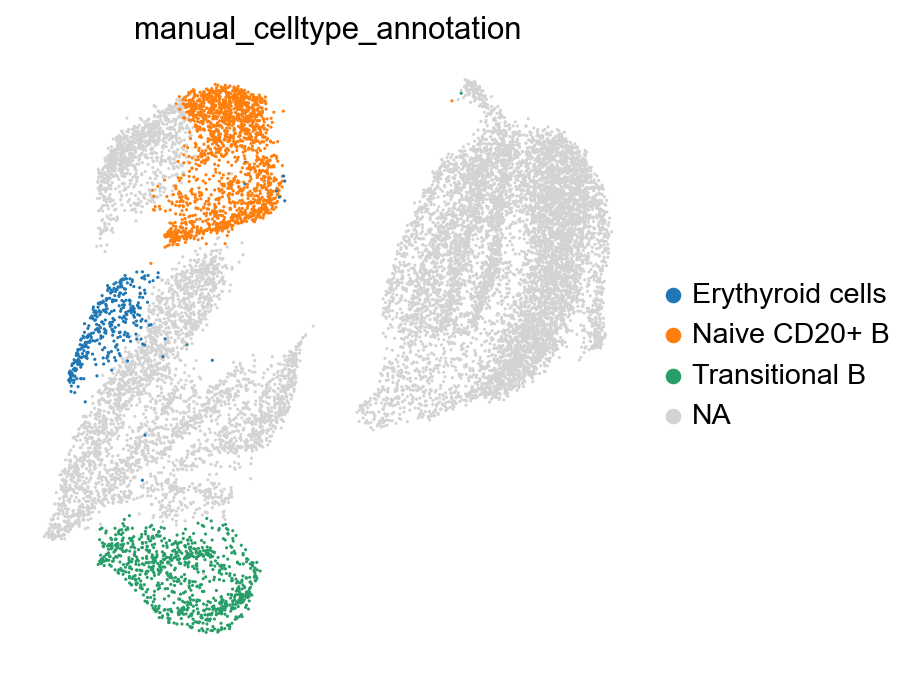

In [51]:
sc.pl.umap(
    adata,
    color=["manual_celltype_annotation"],
    frameon=False,
)

You can see that our naive B cell annotation corresponds well to part of the automatic naive B cell annotation.

However, you'll also notice that our Erythyroid cells cluster is annotated as Tcm/Naive helper T cells in their fine annotation, hence these annotations are partly contradictory.
Looking at the confidence score of both annotations, we see that the annotation of the larger part of the cells is done with relatively low confidence, which is a useful indication that these annotations cannot be copied without careful validation and manual reviewing!


See here the breakdown of cluster 15 in terms of fine celltypist labels:

In [52]:
pd.crosstab(adata.obs.leiden_1, adata.obs.celltypist_cell_label_fine).loc[
    "15", :
].sort_values(ascending=False)

celltypist_cell_label_fine
Pro-B cells                    361
HSC/MPP                          1
Tcm/Naive helper T cells         1
Naive B cells                    1
Small pre-B cells                1
CD16+ NK cells                   0
Classical monocytes              0
Megakaryocyte precursor          0
MAIT cells                       0
Cycling T cells                  0
NK cells                         0
Mid erythroid                    0
Memory B cells                   0
Non-classical monocytes          0
Regulatory T cells               0
Tem/Temra cytotoxic T cells      0
Tem/Trm cytotoxic T cells        0
pDC                              0
Name: 15, dtype: int64

In the coarser cell typist labels we observe different patterns: our cluster 15 is annotated as Erythroid, agreeing with our annotations.

In [53]:
pd.crosstab(adata.obs.leiden_1, adata.obs.celltypist_cell_label_coarse).loc[
    "15", :
].sort_values(ascending=False)

celltypist_cell_label_coarse
B-cell lineage    227
B cells           136
Erythroid           1
HSC/MPP             1
DC                  0
ILC                 0
Monocytes           0
T cells             0
Name: 15, dtype: int64

Although in our case the coarse automated annotation agrees with the manual annotation, this is not always true in practice.
Automated annotations may only partially correspond to manual labels and can even be inconsistent between their own coarse and fine classifications.
Possible reasons for this failure were discussed above.<br>
This underlines that automated annotation algorithms should be used with caution and should be regarded as a starting point for annotating your data, rather than as a final annotation.
Ultimately, expression of known marker genes is still the most accepted support for a cell type annotation.

### Annotation by mapping to a reference

A final way to annotate your data is based on mapping your data to an existing, annotated single-cell reference and then performing label transfer using the resulting joint embedding.
This reference can for example be a single sample that you annotated manually before, after which you would like to transfer those annotations to the rest of your dataset.
Alternatively, it can be a published and ideally well-curated existing reference. In this context we refer to the "new data", i.e. the data to be mapped and annotated, as the "query".<br>
There are multiple existing methods that perform such "query-to-reference mapping", including scArches {cite}`anno:Lotfollahi2022`, Symphony {cite}`anno:Kang2021`, and Azimuth (Seurat) {cite}`anno:HAO20213573`.
All of these methods enable you to map a new dataset to an existing reference without needing to reintegrate the data from the reference and without needing access to the full reference data. 

As query-to-reference mapping involves embedding new data into an __existing__ low-dimensional representation of the reference data, the dimensions and axes of that low-dimensional representation are largely pre-defined before learning from the query.
Therefore, learning and incorporating unseen variation that might be present in the query (both new biological variation, e.g. unseen cell types or states and new technical variation, i.e. unseen batch effects that need to be removed) can be a challenge for these models.
As a result, integration of the query data with the reference might not always be optimal and batch effects might not be fully removed from the joint query-reference embedding.
However, as cell type label transfer does not necessarily require perfect integration but merely close proximity of identical cell types in the embedding, even an imperfect mapping can still be extremely helpful in annotating your data.

scArches, which we will use as an example of reference-mapping-based label transfer, takes as its basis an existing (variational autoencoder-based) model that embeds the reference data in a low-dimensional, batch-corrected space.
It then slightly extends that model to enable the mapping of an unseen dataset into the same "latent space" (i.e. the low-dimensional embedding).
This model extension also enables the learning and removal of batch effects present in the mapped dataset.

We will now show how to map data to a reference using scArches and use this mapping to perform label transfer from the reference to the new data ("query").
```{admonition} Warning
Note that scArches does not run, or runs very slowly if you do not have access to a GPU.
You might therefore need to run this part of the notebook from a computing cluster/server.
```

Let's start by preparing our data for the mapping to a reference.
scArches, the method that enables us to adapt an existing reference model to new data requires raw, non-normalized counts.
We will therefore keep our counts layer and remove all other layers from our adata to map.
We will set our .X to those raw counts as well.

In [54]:
adata_to_map = adata.copy()
for layer in list(adata_to_map.layers.keys()):
    if layer != "counts":
        del adata_to_map.layers[layer]
adata_to_map.X = adata_to_map.layers["counts"]

Moreover, it is important that we use the same input features (i.e. genes) as were used for training our reference model and that we put those features in the same order.
The reference model's feature information is stored together with the model.
Let's load the feature table.

In [56]:
af = ln.Artifact.connect("theislab/sc-best-practices").get(
    key="cellular_structure/annotation_reference_features.csv", is_latest=True
)
reference_model_features = af.load()

The table has both gene names and gene IDs.
As gene IDs are usually less subject to change over genome annotation versions, we will use those to subset our data.
We will therefore set our row names for both our adata and the reference model features to `gene_ids`.
Importantly, we have to make sure to also store the gene names for later use: these are much easier to understand than the gene IDs. 

In [58]:
adata_to_map.var["gene_names"] = adata_to_map.var.index
adata_to_map.var.set_index("gene_ids", inplace=True)

In [59]:
reference_model_features["gene_names"] = reference_model_features.index
reference_model_features.set_index("gene_ids", inplace=True)

Now, let's check if we have all the genes we need in our query data:

In [60]:
print("Total number of genes needed for mapping:", reference_model_features.shape[0])

Total number of genes needed for mapping: 4000


In [61]:
print(
    "Number of genes found in query dataset:",
    adata_to_map.var.index.isin(reference_model_features.index).sum(),
)

Number of genes found in query dataset: 3539


We are missing some genes.
We will manually add those and set their counts to 0, as it seems like these genes were not detected in our data.
Let's create an AnnData object for those missing genes with only zero values (including our raw counts layer, which will be used for the mapping).
We will concatenate that to our own AnnData objects afterwards.

In [62]:
missing_genes = [
    gene_id
    for gene_id in reference_model_features.index
    if gene_id not in adata_to_map.var.index
]

In [63]:
missing_gene_adata = sc.AnnData(
    X=csr_matrix(np.zeros(shape=(adata.n_obs, len(missing_genes))), dtype="float32"),
    obs=adata.obs.iloc[:, :1],
    var=reference_model_features.loc[missing_genes, :],
)
missing_gene_adata.layers["counts"] = missing_gene_adata.X

Concatenate our original adata to the missing genes adata.
To make sure we can do this concatenation without errors, we'll remove the PCA matrix from varm.

In [64]:
if "PCs" in adata_to_map.varm.keys():
    del adata_to_map.varm["PCs"]

In [65]:
adata_to_map_augmented = sc.concat(
    [adata_to_map, missing_gene_adata],
    axis=1,
    join="outer",
    index_unique=None,
    merge="unique",
)

Now subset to the genes used in the model and order correctly:

In [66]:
adata_to_map_augmented = adata_to_map_augmented[
    :, reference_model_features.index
].copy()

Check if our adata gene names correspond exactly to the required gene order:

In [67]:
bool((adata_to_map_augmented.var.index == reference_model_features.index).all())

True

We can now set the gene indices back to gene names for easy interpretation:

In [68]:
adata_to_map_augmented.var["gene_ids"] = adata_to_map_augmented.var.index
adata_to_map_augmented.var.set_index("gene_names", inplace=True)

Finally, this reference model used `adata.obs['batch']` as our batch variable.
We will therefore check that we have this set to one value for our entire sample:

In [73]:
adata

AnnData object with n_obs × n_vars = 14814 × 20223
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_1', 'leiden_2', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispe

In [69]:
adata_to_map_augmented.obs.batch.unique()

AttributeError: 'DataFrame' object has no attribute 'batch'

Now let's talk about our reference model. The better our reference model, the better our label transfer will perform. Using well-annotated reference that integrates many different datasets and that matches your data well (same organ, same single-cell technology etc.) is ideal: such models are trained on a variety of datasets and batches and are therefore expected to be more robust to batch effects. However, such references do not exist yet for all tissues. For this tutorial we will use a reference model trained on the bone marrow samples that we have been using throughout the book, excluding the sample that we will be mapping. The reference model is an scvi-model (used for data integration) that generates a low-dimensional, integrated embedding of the input data, see also the scvi-publication {cite}`anno:Lopez2018-zc`. Note that this is a toy model generated for this tutorial and it should  not be used in other contexts.<br>
We will start by loading the model and passing it the adata which we want to map:

In [64]:
# loading model.pt from figshare
if not Path("./reference_model").exists():
    Path("./reference_model").mkdir()
elif not Path("./reference_model/model.pt").exists():
    urllib.request.urlretrieve(
        "https://figshare.com/ndownloader/files/41436648",
        filename="reference_model/model.pt",
    )

In [65]:
scarches_model = sca.models.SCVI.load_query_data(
    adata=adata_to_map_augmented,
    reference_model="./reference_model",
    freeze_dropout=True,
)

INFO     File ./reference_model/model.pt already downloaded                                                        


ModuleNotFoundError: No module named 'pandas.core.indexes.numeric'

We will now update this reference model so that we can embed our own data (the "query") in the same latent space as the reference. This requires training on our query data using scArches:

In [70]:
scarches_model.train(max_epochs=500, plan_kwargs={"weight_decay": 0.0})

INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [03:55<00:00,  2.24it/s, v_num=1, train_loss_step=673, train_loss_epoch=653]

INFO: `Trainer.fit` stopped: `max_epochs=500` reached.
`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|██████████| 500/500 [03:55<00:00,  2.12it/s, v_num=1, train_loss_step=673, train_loss_epoch=653]


Now that we have updated the model, we can calculate the (ideally batch-corrected) latent representation of our query:

In [71]:
adata.obsm["X_scVI"] = scarches_model.get_latent_representation()

We can now use this newly calculated low-dimensional embedding as a basis for visualization and clustering. Let's calculate the new UMAP using the scVI-based representation of the data.

In [72]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

To see if the mapping-based UMAP makes general sense, let's look at a few markers and if their expression is localized to specific parts of the UMAP:

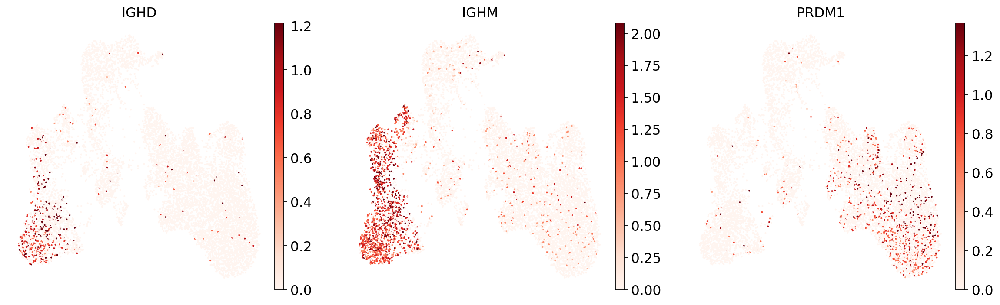

In [73]:
sc.pl.umap(
    adata,
    color=["IGHD", "IGHM", "PRDM1"],
    vmin=0,
    vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
    sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
    frameon=False,
    cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
)

Now the essential step is that we can combine the inferred latent space embedding of our query data with the existing reference embedding. Using this joint embedding, we will not only be able to e.g. visualize and cluster the two together, but we can also do label transfer from the query to the reference.<br> 
Let's load the reference embedding: this is often made publicly available with existing atlases.

In [74]:
ref_emb = sc.read(
    filename="reference_embedding.h5ad",
    backup_url="https://figshare.com/ndownloader/files/41376264",
)

We'll store a variable specifying that these cells are from the reference.

In [75]:
ref_emb.obs["reference_or_query"] = "reference"

Let's see what's in this reference object: 

In [76]:
ref_emb

AnnData object with n_obs × n_vars = 86332 × 10
    obs: 'donor', 'batch', 'site', 'cell_type', 'reference_or_query'
    uns: 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

As you can see it has only 10 dimensions (in `.X`) which together represent the latent space embedding of the reference cells. Our query embedding that we calculated for our own data also has 10 dimensions. The 10 dimensions of the reference and query are the same and can be combined!<br>
Moreover, it has cell type labels in `.obs['cell_type']`. We will use these labels to annotate our own data.

To perform the label transfer, we will first concatenate the reference and query data using the 10-dimensional embedding. To get there, we will create the same type of AnnData object from our query data as we have from the reference (with the embedding under `.X`) and concatenate the two. With that, we can jointly analyze reference and query including doing transfer from one to the other.

In [77]:
adata_emb = sc.AnnData(X=adata.obsm["X_scVI"], obs=adata.obs)

In [78]:
adata_emb.obs["reference_or_query"] = "query"

In [79]:
emb_ref_query = sc.concat(
    [ref_emb, adata_emb],
    axis=0,
    join="outer",
    index_unique=None,
    merge="unique",
)

Let's visualize the joint embedding with a UMAP.

In [80]:
sc.pp.neighbors(emb_ref_query)
sc.tl.umap(emb_ref_query)

We can visually get a first impression of whether the reference and query integrated well based on the UMAP:

... storing 'reference_or_query' as categorical


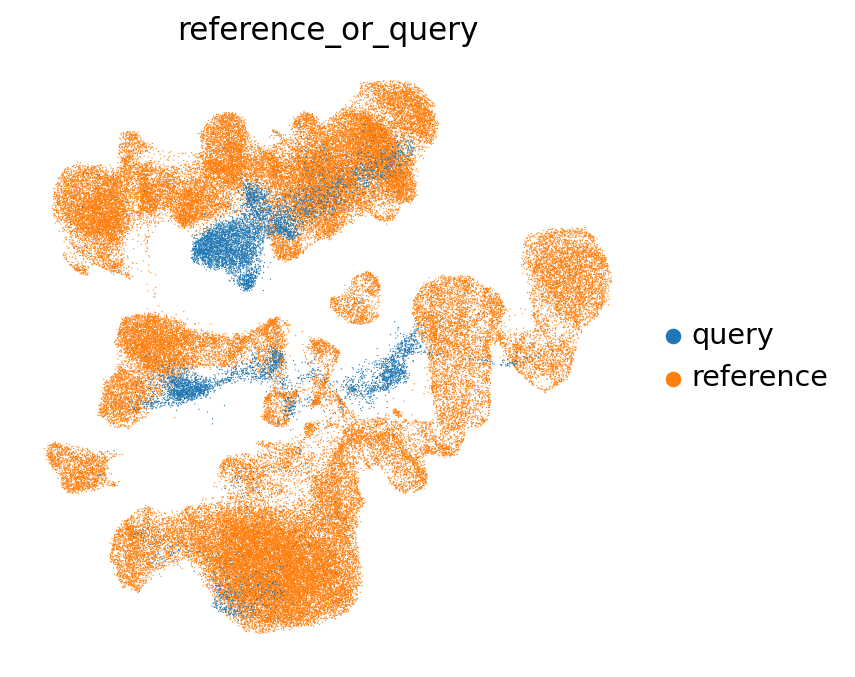

In [81]:
sc.pl.umap(
    emb_ref_query,
    color=["reference_or_query"],
    sort_order=False,
    frameon=False,
)

The (partial) mixing of query and reference in this UMAP is a good sign! When mapping completely fails, you will often see a full separation of query and reference in the UMAP.

Now let's look at the cell type annotations from the reference. All cells from the query are set to NA here as they don't have annotations yet and shown in black.

We'll make this figure a bit bigger so that we can read the legend well:

In [82]:
sc.set_figure_params(figsize=(8, 8))

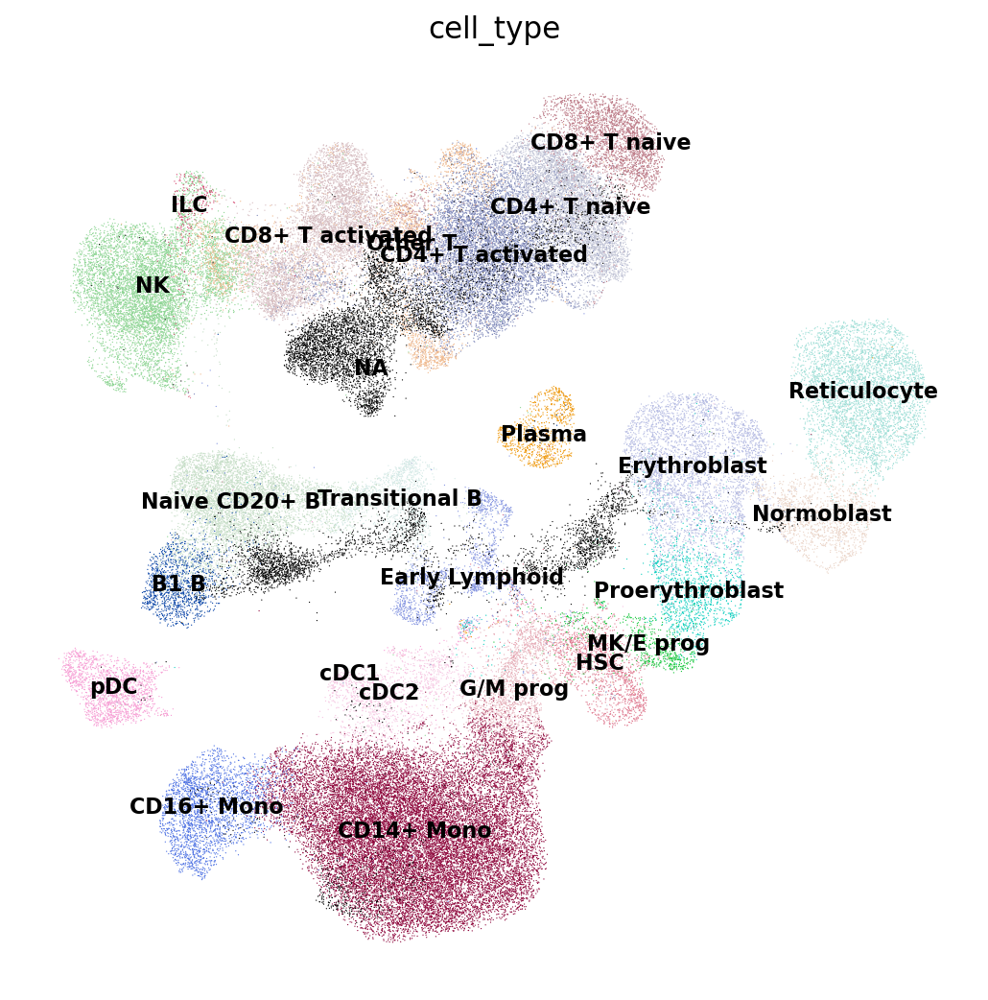

In [83]:
sc.pl.umap(
    emb_ref_query,
    color=["cell_type"],
    sort_order=False,
    frameon=False,
    legend_loc="on data",
    legend_fontsize=10,
    na_color="black",
)

As you can already tell from the UMAP, we can guess the cell type of each of our own cells (in black) by looking at which cell types from the reference surround it. This is exactly what a nearest-neighbor-graph-based label transfer approach does: for each query cell it checks what is the most common cell type among its neighboring reference cells. The higher the fraction of reference cells coming from a single cell type, the more confident the label transfer is.

Let's perform the KNN-based label transfer. 

First we set up the label transfer model:

In [84]:
knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata=ref_emb,
    train_adata_emb="X",  # location of our joint embedding
    n_neighbors=15,
)

Weighted KNN with n_neighbors = 15 ... 

Now we perform the label transfer:

In [85]:
labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=adata_emb,
    query_adata_emb="X",  # location of our embedding, query_adata.X in this case
    label_keys="cell_type",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=ref_emb.obs,
)

finished!


And store the results in our adata:

In [86]:
adata_emb.obs["transf_cell_type"] = labels.loc[adata_emb.obs.index, "cell_type"]
adata_emb.obs["transf_cell_type_unc"] = uncert.loc[adata_emb.obs.index, "cell_type"]

Let's transfer the results to our query adata object which also has our UMAP and gene counts, so that we can visualize all of those together.

In [87]:
adata.obs.loc[adata_emb.obs.index, "transf_cell_type"] = adata_emb.obs[
    "transf_cell_type"
]
adata.obs.loc[adata_emb.obs.index, "transf_cell_type_unc"] = adata_emb.obs[
    "transf_cell_type_unc"
]

We can now visualize the transferred labels in our previously calculated UMAP of our own data:

Let's set the figure size smaller again:

In [88]:
sc.set_figure_params(figsize=(5, 5))

... storing 'transf_cell_type' as categorical


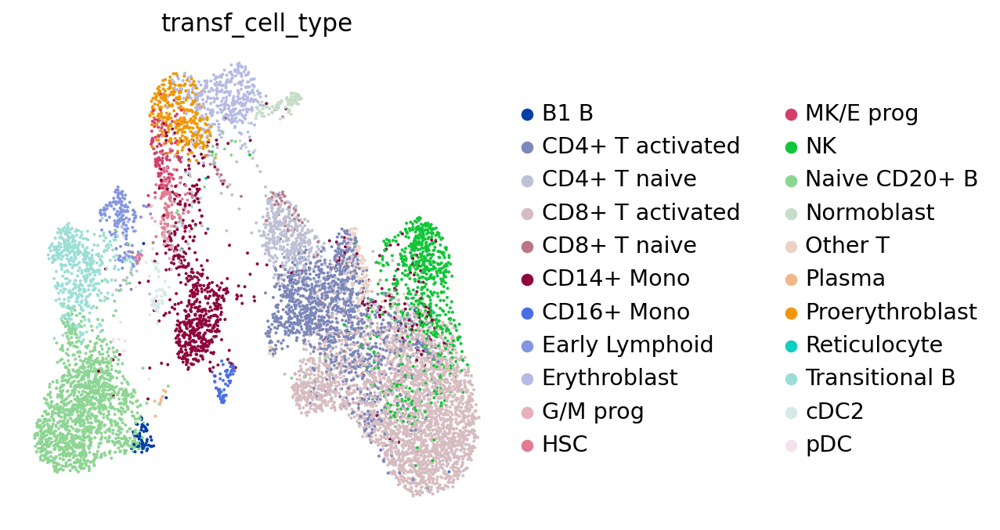

In [89]:
sc.pl.umap(adata, color="transf_cell_type", frameon=False)

Based on the neighbors of each of our query cells we can not only guess the cell type these cells belong to, but also generate a measure for certainty of that label: if a cell has neighbors from several different cell types, our guess will be highly uncertain. This is relevant to assess to what extent we can "trust" the transferred labels! Let's visualize the uncertainty scores:

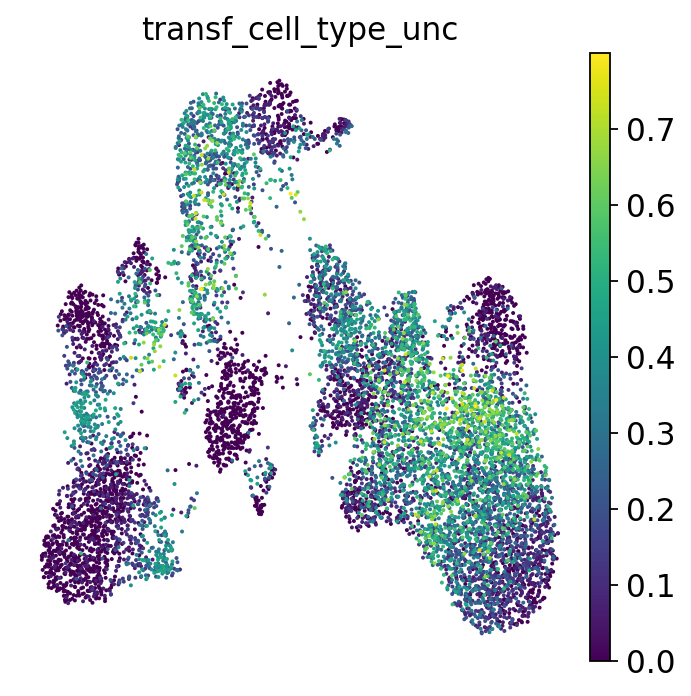

In [90]:
sc.pl.umap(adata, color="transf_cell_type_unc", frameon=False)

Let's check for each cell type label how high the label transfer uncertainty levels were. This gives us a first impression of which annotations are more contentious/need more manual checks.

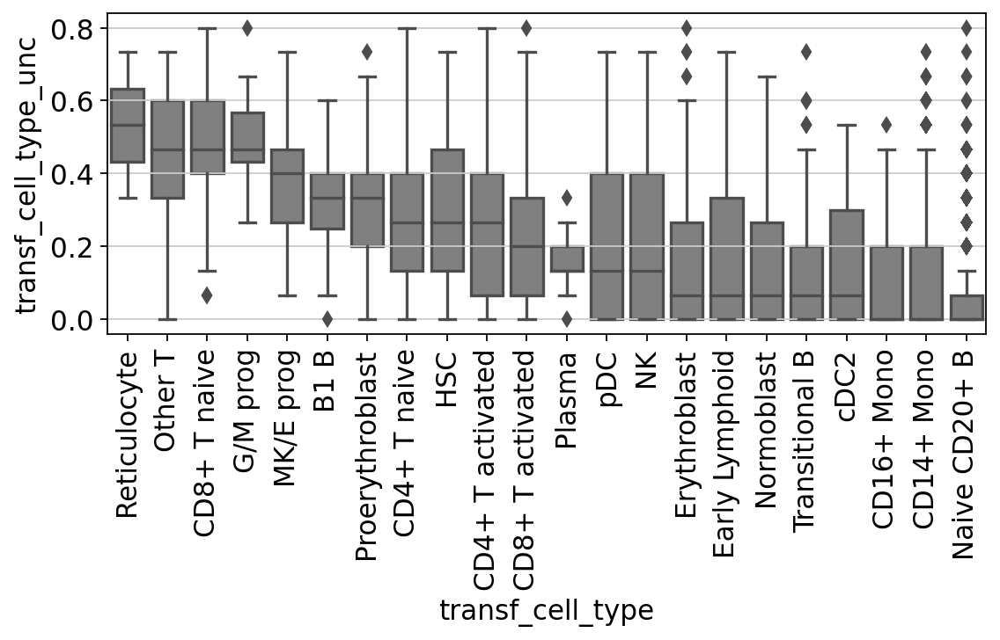

In [91]:
fig, ax = plt.subplots(figsize=(8, 3))
ct_order = (
    adata.obs.groupby("transf_cell_type")
    .agg({"transf_cell_type_unc": "median"})
    .sort_values(by="transf_cell_type_unc", ascending=False)
)
sns.boxplot(
    adata.obs,
    x="transf_cell_type",
    y="transf_cell_type_unc",
    color="grey",
    ax=ax,
    order=ct_order.index,
)
ax.tick_params(rotation=90, axis="x")

You'll notice that e.g. progenitor cells are often more difficult to distinguish than other cell types. Same for the rather unspecific category "Other T" cells in our annotations. All the way on the right we see pDCs, a cell type that is known to be quite transcriptionally distinct and therefore easier to recognize and label.

To incorporate this uncertainty information in our transferred labels, we can set cells with an uncertainty score above e.g. 0.2 to "unknown":

In [92]:
adata.obs["transf_cell_type_certain"] = adata.obs.transf_cell_type.tolist()
adata.obs.loc[adata.obs.transf_cell_type_unc > 0.2, "transf_cell_type_certain"] = (
    "Unknown"
)

Let's see what our annotations look like after this filtering. Note the Unknown color in the legend and the UMAP.

... storing 'transf_cell_type_certain' as categorical


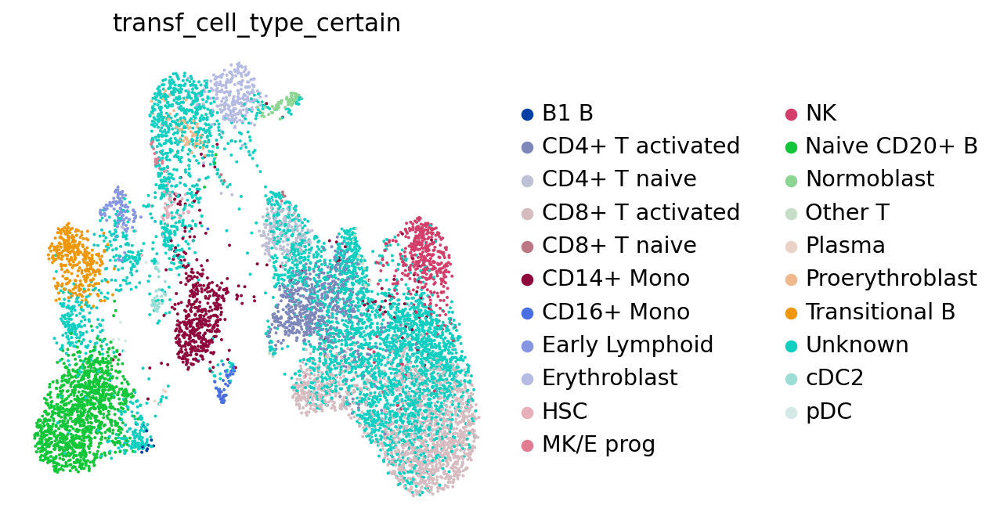

In [93]:
sc.pl.umap(adata, color="transf_cell_type_certain", frameon=False)

To ease legibility, we can color *only* the "unknown" cells. This will make it easier for us to see how many of those there are. You can do the same with any of the other cell type labels.

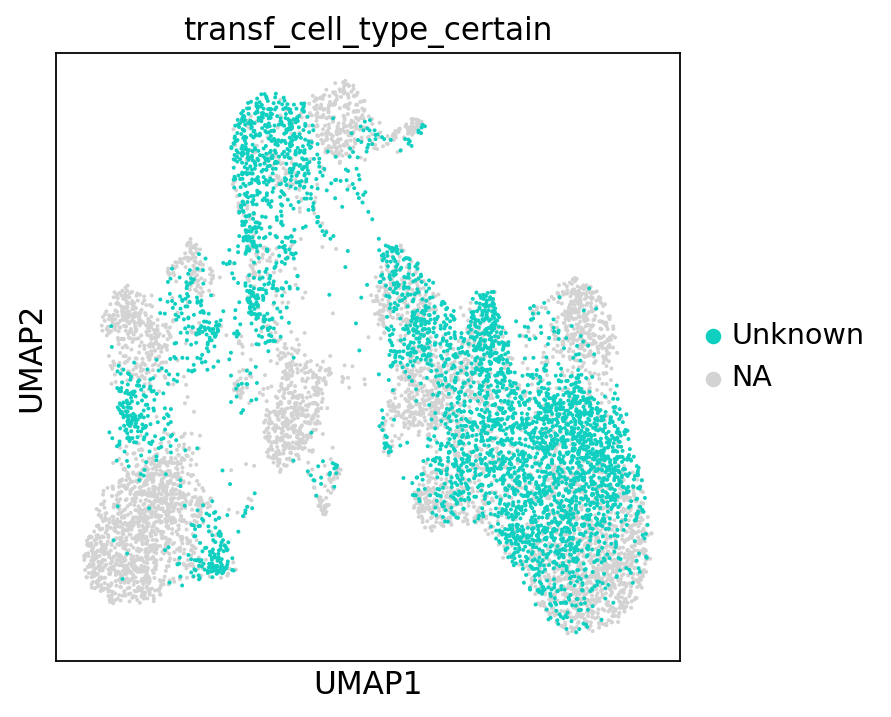

In [94]:
sc.pl.umap(adata, color="transf_cell_type_certain", groups="Unknown")

There are quite many of them! These cells will need particularly careful manual reviewing. However, the low-uncertainty annotations surrounding the "unknown cells" will already give us a first idea of what cell type we can expect each cell to belong to.

Now let's take a look at our more certain annotations. We will check for a few cell types (chosen at random here) to what extent the reference-transferred annotation matches our known marker genes from above. In reality, this should be done systematically for all annotations!

In [95]:
cell_types_to_check = [
    "CD14+ Mono",
    "cDC2",
    "NK",
    "B1 B",
    "CD4+ T activated",
    "T naive",
    "MK/E prog",
]

Conveniently, for each of these cell types we have markers in our dictionary. Let's plot marker expression for all our newly annotated cell types. You will notice that marker expression generally corresponds to the automated annotations, a good sign!

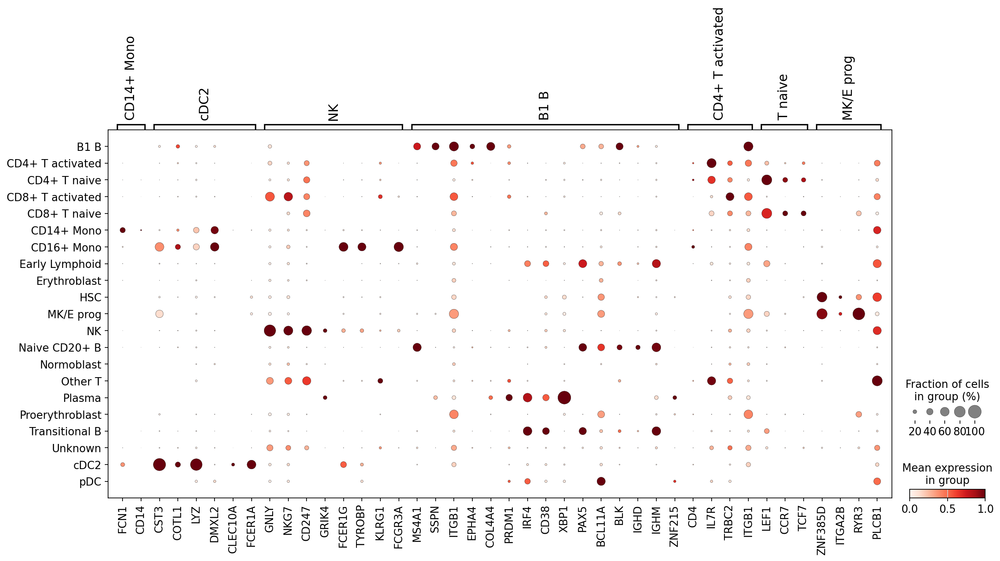

In [96]:
sc.pl.dotplot(
    adata,
    var_names={
        ct: marker_genes_in_data[ct] for ct in cell_types_to_check
    },  # gene names grouped by cell type in a dictionary
    groupby="transf_cell_type_certain",
    standard_scale="var",  # normalize gene scores from 0 to 1
)

As you can see, the marker groups are generally most highly expressed in the cells annotated with the matching label. This means these labels are likely (at least partially) correct!

Let's go back one more time to our UMAP colored by uncertainty:

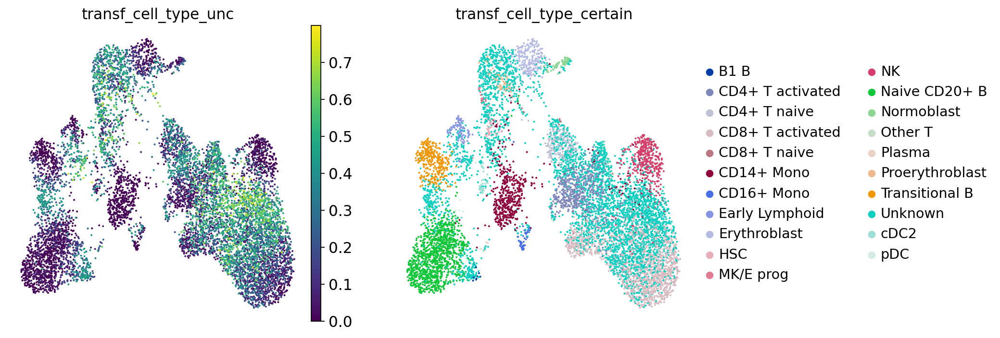

In [97]:
sc.pl.umap(
    adata, color=["transf_cell_type_unc", "transf_cell_type_certain"], frameon=False
)

The uncertainty not only helps us identify regions where the algorithm is uncertain about which cell type a cell belongs to (e.g. because it falls in between two annotated phenotypes), but can also highlight unseen cell types or new cell states. For example, your reference might consist of healthy cells while your query could be from a diseased sample. The uncertainty score can then highlight disease-specific cell states, as they might not have neighbors from the reference that consistently come from a single cell type. Especially when your reference is based on a large set of datasets, the uncertainty score is useful to flag parts of the query data that could be interesting to look into. Reference-based label transfer thus not only helps you annotate your data, but can also speed up exploration and interpretation of your data. However, like any metric, these uncertainty scores are often not perfect and in some cases fail to highlight new cell types or states. For a more extensive discussion of uncertainty metrics, see e.g. {cite}`anno:Engelmann2019`.

Like with any of the methods discussed in this notebook, the quality of the transferred annotations depends on the quality of the "training data" (in this case the reference) and its annotations, the quality of the model, and the match of your own data with the training data! 

The quality of the transferred annotations should therefore always be validated with manual inspection using marker gene expression and refinement of the initial annotations might be needed. 

Finally, store your adata object if wanted:

In [98]:
# adata.write("./annotation_adata_out.h5ad")

## References

```{bibliography}
:filter: docname in docnames
:labelprefix: anno
```

## Contributors
We gratefully acknowledge the contributions of:
### Authors
- Lisa Sikkema
- Maren Büttner
- Seo H. Kim
### Reviewers
- Lukas Heumos